In [192]:
#!pip install scikit-plot

In [193]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [194]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)

In [195]:
df_train = pd.read_csv('train_log.csv')

In [196]:
df_train.dtypes

originalTitle       object
rating              object
startYear            int64
runtimeMinutes       int64
awardWins          float64
numVotes           float64
totalImages        float64
totalVideos        float64
totalCredits         int64
titleType           object
AwNmExWins         float64
canHaveEpisodes       bool
isAdult               bool
numRegions           int64
countryOfOrigin     object
genres              object
ratingMean         float64
ReviewsTotal       float64
dtype: object

In [197]:
count = df_train['countryOfOrigin'].value_counts()
pd.set_option('display.max_rows', None)  # None per mostrare tutte le righe
print(count)

countryOfOrigin
['US']                                                          6559
['GB']                                                          1498
['JP']                                                           750
['IN']                                                           547
['FR']                                                           510
['CA']                                                           389
['DE']                                                           360
['AU']                                                           282
['IT']                                                           269
['ES']                                                           234
['SUHH']                                                         220
['MX']                                                           190
['TR']                                                           167
['XWG']                                                          159
['BR']            

In [198]:
# Calcolo del numero di virgole per ogni riga nella colonna 'countryOfOrigin'
df_train['number_of_countries'] = df_train['countryOfOrigin'].apply(lambda x: x.count(',')+1)
df_train['number_of_us'] = df_train['countryOfOrigin'].apply(lambda x: x.count('US'))

# Visualizza il risultato
#print(df_train[['countryOfOrigin', 'number_of_countries']])

count = df_train['number_of_countries'].value_counts()
pd.set_option('display.max_rows', None)  # None per mostrare tutte le righe
print(count)

number_of_countries
1     14793
2       888
3       165
4        49
5        16
6         6
7         5
8         2
10        1
Name: count, dtype: int64


In [199]:
df_train['number_of_us'] = df_train['countryOfOrigin'].apply(lambda x: x.count('US'))
count = df_train['number_of_us'].value_counts()
print(count)

number_of_us
0    8915
1    7010
Name: count, dtype: int64


In [200]:
df_train['produced_in_USA'] = df_train['number_of_us'].apply(lambda x: 1 if x > 0 else 0)

In [201]:
# Calcolare il numero di elementi distinti nella colonna 'genres'
num_elementi_distinti = df_train['genres'].nunique()

print(f"Il numero di generi distinti è: {num_elementi_distinti}")

Il numero di generi distinti è: 781


In [202]:
# Separare i generi e ottenere i generi unici
generi_singoli = df_train['genres'].dropna().apply(lambda x: x.split(','))

# Espandere la lista di generi in un'unica lista
tutti_i_generi = [genere.strip() for sublist in generi_singoli for genere in sublist]

# Determinare i generi distinti
generi_distinti = set(tutti_i_generi)

# Contare i generi distinti
numero_generi_distinti = len(generi_distinti)

print(f"I generi distinti sono: {generi_distinti}")
print(f"Il numero di generi distinti è: {numero_generi_distinti}")


I generi distinti sono: {'Adult', 'Reality-TV', 'Sport', 'Sci-Fi', 'War', 'Mystery', 'Talk-Show', 'Game-Show', 'History', 'Romance', 'Horror', 'Action', 'News', 'Film-Noir', 'Thriller', 'Comedy', 'Short', 'Crime', 'Family', 'Fantasy', 'Adventure', 'Musical', 'Western', 'Animation', 'Music', 'Documentary', 'Drama', 'Biography'}
Il numero di generi distinti è: 28


In [203]:
# # Separare i generi e ottenere i generi unici
# generi_singoli = df_test['genres'].dropna().apply(lambda x: x.split(','))

# # Espandere la lista di generi in un'unica lista e ottenere i generi distinti
# tutti_i_generi = [genere.strip() for sublist in generi_singoli for genere in sublist]
# generi_distinti = set(tutti_i_generi)

# # Creare colonne binarie per ogni genere distinto
# for genere in generi_distinti:
#     df_test[genere] = df_test['genres'].apply(lambda x: int(genere in x.split(',')) if pd.notna(x) else 0)

# # Visualizzare il DataFrame aggiornato
# df_test.head()


In [204]:
# Contare quanti sono pre 2000 e quanti no
counts = df_train['startYear'].apply(lambda x: 'pre 2000' if x < 2000 else 'post 2000').value_counts()

# Stampare i risultati
print(counts)


startYear
pre 2000     8678
post 2000    7247
Name: count, dtype: int64


In [205]:
# # Creare una nuova colonna 'pre 2000' con valori binari
# df_test['pre 2000'] = df_train['startYear'].apply(lambda x: 1 if x < 2000 else 0)

# # Visualizzare i risultati
# print(df_train[['startYear', 'pre 2000']].head())


In [206]:
df_train.head()

,originalTitle,rating,startYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,titleType,...,canHaveEpisodes,isAdult,numRegions,countryOfOrigin,genres,ratingMean,ReviewsTotal,number_of_countries,number_of_us,produced_in_USA
0,Neogenic Nightmare Chapter 3: Hydro-Man,"(7, 8]",1995,40,0.000000,6.659294,0.693147,0.000000,21,tvEpisode,...,False,False,1,['US'],"Action,Adventure,Animation",7.5,0.693147,1,1,1
1,Looping,"(5, 6]",1982,28,0.000000,2.484907,0.693147,0.000000,1,videoGame,...,False,False,1,['XWG'],Action,5.5,0.000000,1,0,0
2,Idealnaya para,"(5, 6]",1992,92,0.000000,3.663562,0.693147,0.000000,24,movie,...,False,False,1,['RU'],Comedy,5.5,0.693147,1,0,0
3,MasterChef Celebrity México,"(5, 6]",2021,53,0.000000,2.772589,3.135494,0.000000,56,tvSeries,...,True,False,1,['MX'],Reality-TV,5.5,0.000000,1,0,0
4,Seutateueob,"(7, 8]",2020,80,0.693147,9.662625,5.852202,1.098612,47,tvSeries,...,True,False,32,['KR'],"Comedy,Drama,Romance",7.5,6.124683,1,0,0


In [207]:
mapping = {
    'short': 'short',
    'tvShort': 'short',
    'movie': 'movie',
    'tvMovie': 'movie',
    'tvSpecial': 'special',
    'videogame': 'videogame',
    'video': 'video',
    'tvMiniseries': 'tvseries_related',
    'tvSeries': 'tvseries_related',
    'tvEpisode': 'tvseries_related'
}

df_train['grouped_titleType'] = df_train['titleType'].replace(mapping)

In [208]:
del df_train['originalTitle']
del df_train['titleType'] 
del df_train['rating']
del df_train['genres']
del df_train['countryOfOrigin']
del df_train['isAdult']
#del df_train['startYear']
del df_train['number_of_countries']
del df_train['number_of_us']
# del df_train['canHaveEpisodes']

In [209]:
# Trasformare la colonna booleana 'canHaveEpisodes' in 1/0
df_train['canHaveEpisodes'] = df_train['canHaveEpisodes'].astype(int)

# Visualizzare i risultati
print(df_train[['canHaveEpisodes']].head())


   canHaveEpisodes
0                0
1                0
2                0
3                1
4                1


In [210]:
df_train.head()

,startYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,AwNmExWins,canHaveEpisodes,numRegions,ratingMean,ReviewsTotal,produced_in_USA,grouped_titleType
0,1995,40,0.000000,6.659294,0.693147,0.000000,21,0.000000,0,1,7.5,0.693147,1,tvseries_related
1,1982,28,0.000000,2.484907,0.693147,0.000000,1,0.000000,0,1,5.5,0.000000,0,videoGame
2,1992,92,0.000000,3.663562,0.693147,0.000000,24,0.000000,0,1,5.5,0.693147,0,movie
3,2021,53,0.000000,2.772589,3.135494,0.000000,56,0.000000,1,1,5.5,0.000000,0,tvseries_related
4,2020,80,0.693147,9.662625,5.852202,1.098612,47,0.693147,1,32,7.5,6.124683,0,tvseries_related


In [211]:
from sklearn.model_selection import train_test_split

In [212]:
attributes = [col for col in df_train.columns if col != 'grouped_titleType']
X = df_train[attributes].values
y = df_train['grouped_titleType'] 

In [213]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, stratify=y, random_state=42)
# with stratify
print(np.unique(y, return_counts=True)[1] / len(y))
print(np.unique(y_train, return_counts=True)[1] / len(y_train))
print(np.unique(y_test, return_counts=True)[1] / len(y_test))

[0.3855573  0.15510204 0.00929356 0.01312402 0.37513344 0.04803768
 0.01375196]
[0.3855573  0.15510204 0.0093145  0.01308216 0.37519623 0.04803768
 0.0137101 ]
[0.3855573  0.15510204 0.00926217 0.01318681 0.37503925 0.04803768
 0.01381476]


In [214]:
df_train.head()


,startYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,AwNmExWins,canHaveEpisodes,numRegions,ratingMean,ReviewsTotal,produced_in_USA,grouped_titleType
0,1995,40,0.000000,6.659294,0.693147,0.000000,21,0.000000,0,1,7.5,0.693147,1,tvseries_related
1,1982,28,0.000000,2.484907,0.693147,0.000000,1,0.000000,0,1,5.5,0.000000,0,videoGame
2,1992,92,0.000000,3.663562,0.693147,0.000000,24,0.000000,0,1,5.5,0.693147,0,movie
3,2021,53,0.000000,2.772589,3.135494,0.000000,56,0.000000,1,1,5.5,0.000000,0,tvseries_related
4,2020,80,0.693147,9.662625,5.852202,1.098612,47,0.693147,1,32,7.5,6.124683,0,tvseries_related


### Decision Tree

In [215]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [216]:
dt = DecisionTreeClassifier()

In [217]:
%%time
dt.fit(X_train, y_train)

CPU times: total: 46.9 ms
Wall time: 62.2 ms


DecisionTreeClassifier()

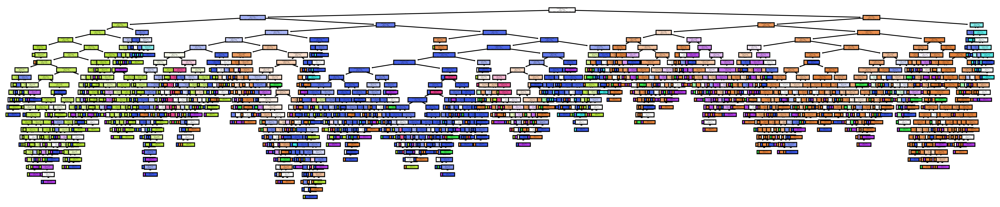

In [218]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [219]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
)

In [220]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [221]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 1.0
Train F1-score [1. 1. 1. 1. 1. 1. 1.]

Test Accuracy 0.8620094191522762
Test F1-score [0.900163   0.86717557 0.19672131 0.67088608 0.89855679 0.46909667
 0.78857143]


In [222]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

           movie       0.90      0.90      0.90      2456
           short       0.87      0.86      0.87       988
         special       0.19      0.20      0.20        59
    tvMiniSeries       0.72      0.63      0.67        84
tvseries_related       0.90      0.90      0.90      2389
           video       0.46      0.48      0.47       306
       videoGame       0.79      0.78      0.79        88

        accuracy                           0.86      6370
       macro avg       0.69      0.68      0.68      6370
    weighted avg       0.86      0.86      0.86      6370



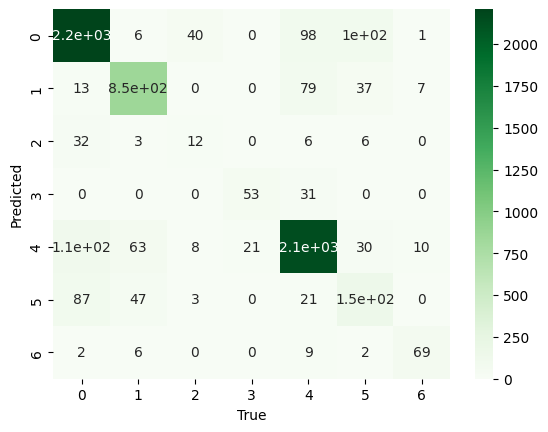

In [223]:
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [224]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

runtimeMinutes 0.6482955899506185
totalCredits 0.06514929232266768
canHaveEpisodes 0.06356848451286344
startYear 0.05913110608208756
numVotes 0.0440654775601472
totalImages 0.031110895452467216
numRegions 0.023231348275424665
ratingMean 0.018426071734096536
ReviewsTotal 0.018339402075267863
produced_in_USA 0.016235028867139886
awardWins 0.00562073634144963
AwNmExWins 0.004136720443122009
totalVideos 0.002689846382647731


### OVERFITTING 

In [225]:
nodes = []
train_err = []
test_err = []

for max_depth in list(np.arange(1, 20)):
    dt = DecisionTreeClassifier(max_depth=max_depth)
    dt.fit(X_train, y_train)
    y_train_pred = dt.predict(X_train)
    y_test_pred = dt.predict(X_test)

    train_err.append(1 - accuracy_score(y_train, y_train_pred))
    test_err.append(1 - accuracy_score(y_test, y_test_pred))
    nodes.append(dt.tree_.node_count)

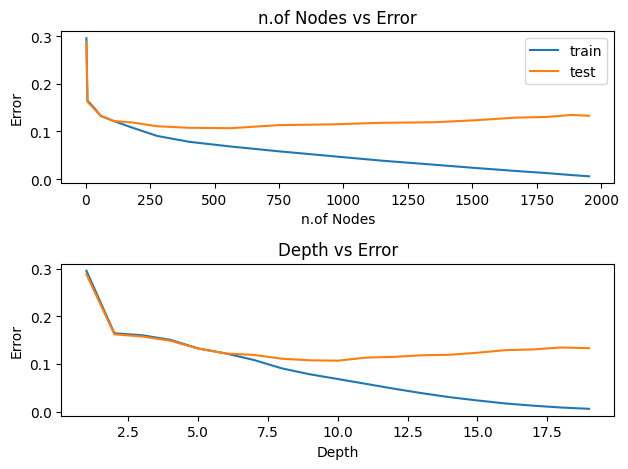

In [226]:
fig, ax = plt.subplots(2,1)
ax[0].plot(nodes, train_err, label='train')
ax[0].plot(nodes, test_err, label='test')
ax[0].legend()

ax[0].set_xlabel("n.of Nodes")
ax[0].set_ylabel("Error")
ax[0].set_title("n.of Nodes vs Error")

ax[1].plot(list(np.arange(1, 20)), train_err, label='train')
ax[1].plot(list(np.arange(1, 20)), test_err, label='test')

ax[1].set_xlabel("Depth")
ax[1].set_ylabel("Error")
ax[1].set_title("Depth vs Error")

plt.tight_layout()
plt.show()

In [227]:
from sklearn.model_selection import cross_val_score

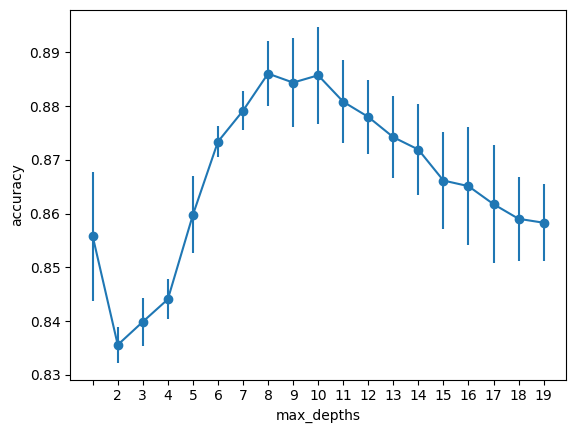

In [228]:

max_depths = [None] + list(np.arange(2, 20))
avg_scores = list()
std_scores = list()

for max_depth in max_depths:
    dt = DecisionTreeClassifier(max_depth=max_depth)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(max_depths)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(max_depths)), max_depths)
plt.xlabel("max_depths")
plt.ylabel("accuracy")
plt.show()

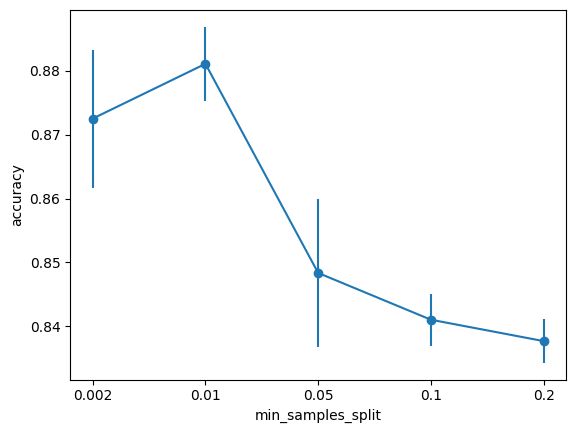

In [229]:
min_samples_splits = [0.002, 0.01, 0.05, 0.1, 0.2]
avg_scores = list()
std_scores = list()

for min_samples_split in min_samples_splits:
    dt = DecisionTreeClassifier(min_samples_split=min_samples_split)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_splits)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_splits)), min_samples_splits)
plt.xlabel("min_samples_split")
plt.ylabel("accuracy")
plt.show()

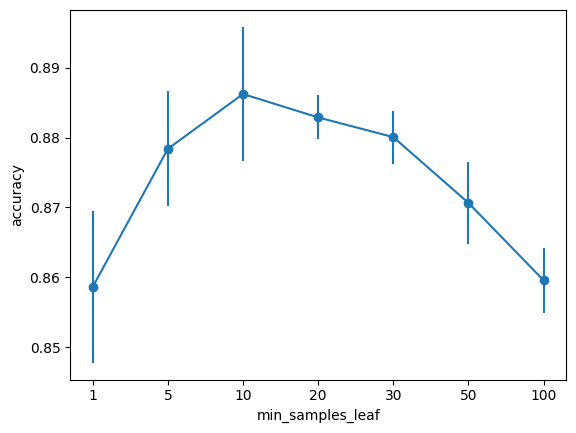

In [230]:

min_samples_leafs = [1, 5, 10, 20, 30, 50, 100]
avg_scores = list()
std_scores = list()

for min_samples_leaf in min_samples_leafs:
    dt = DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    scores = cross_val_score(dt, X_train, y_train, cv=5)
    avg_scores.append(np.mean(scores))
    std_scores.append(np.std(scores))

plt.errorbar(range(len(min_samples_leafs)), y=avg_scores, yerr=std_scores, marker='o')
plt.xticks(range(len(min_samples_leafs)), min_samples_leafs)
plt.xlabel("min_samples_leaf")
plt.ylabel("accuracy")
plt.show()

In [231]:
dt = DecisionTreeClassifier(
    max_depth=7,
    min_samples_split=0.01,
    min_samples_leaf=20
)
dt.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=7, min_samples_leaf=20, min_samples_split=0.01)

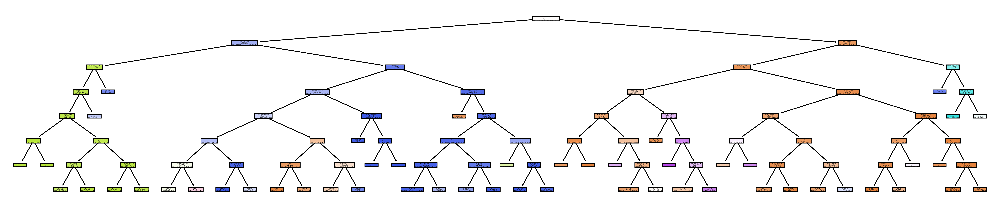

In [232]:
plt.figure(figsize=(20, 4), dpi=700)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [233]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [234]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8805860805860806
Train F1-score [0.92064766 0.88932547 0.         0.79487179 0.89701181 0.58224543
 0.48829431]

Test Accuracy 0.8770800627943485
Test F1-score [0.92844329 0.8691358  0.         0.69503546 0.89964532 0.53473684
 0.4       ]


In [235]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

           movie       0.91      0.95      0.93      2456
           short       0.85      0.89      0.87       988
         special       0.00      0.00      0.00        59
    tvMiniSeries       0.86      0.58      0.70        84
tvseries_related       0.90      0.90      0.90      2389
           video       0.75      0.42      0.53       306
       videoGame       0.32      0.52      0.40        88

        accuracy                           0.88      6370
       macro avg       0.66      0.61      0.62      6370
    weighted avg       0.87      0.88      0.87      6370



c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



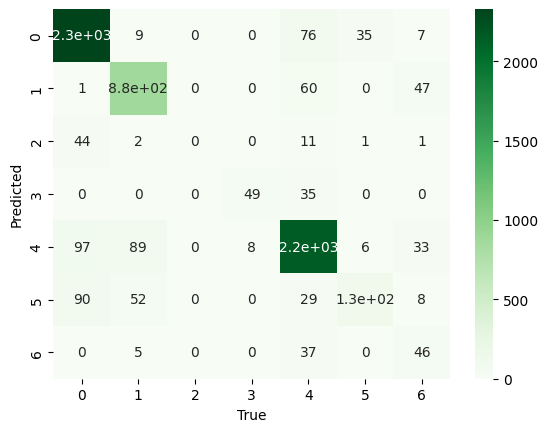

In [236]:
cf = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cf, annot=True, cmap="Greens")
plt.xlabel("True")
plt.ylabel("Predicted")
plt.show()

In [237]:
zipped = zip(attributes, dt.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

runtimeMinutes 0.8220633723132454
canHaveEpisodes 0.06720582537597813
totalCredits 0.027298429424389134
totalImages 0.020987563495147302
startYear 0.018755393557521004
numRegions 0.01857768912338798
produced_in_USA 0.013434899426254277
numVotes 0.0037444596527234026
awardWins 0.003665388370862464
ReviewsTotal 0.0021625495866887316
AwNmExWins 0.0016851957206598395
ratingMean 0.0004192339531425012
totalVideos 0.0


### Randomized Search

In [238]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning:

invalid value encountered in cast



{'min_samples_split': 10, 'min_samples_leaf': 10, 'max_depth': np.int64(10), 'criterion': 'gini'} 0.8888749345892202
Accuracy: 0.8957613814756672


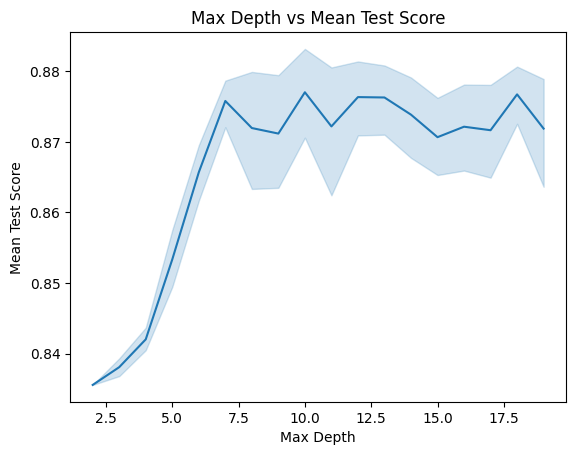

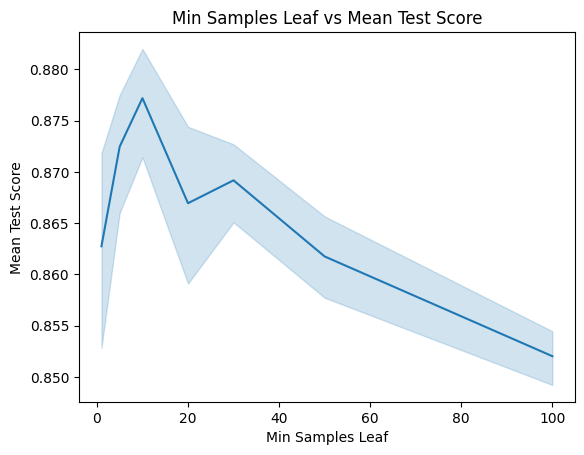

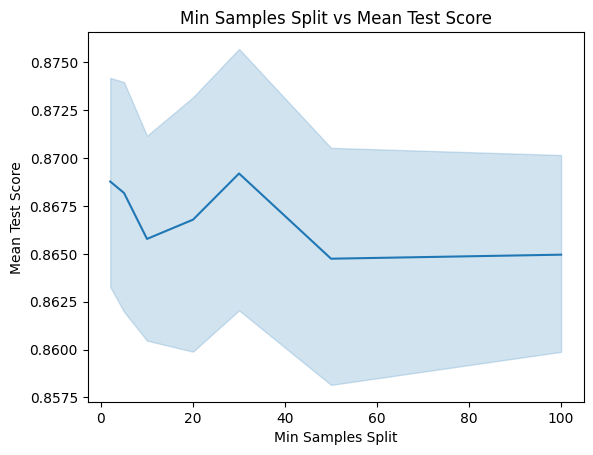

runtimeMinutes 0.7730711860119808
canHaveEpisodes 0.07591915724437626
totalCredits 0.039326994803114815
startYear 0.030989837765852485
numRegions 0.0220470563360479
totalImages 0.021054030360767608
produced_in_USA 0.012830541923661794
numVotes 0.009379001541666973
awardWins 0.004854280360250684
ratingMean 0.004521264740222793
ReviewsTotal 0.00406530890862508
AwNmExWins 0.0019190226397291694
totalVideos 2.231736370386024e-05


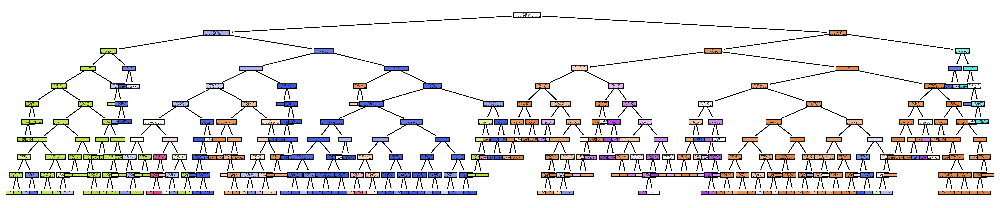

CPU times: total: 19.1 s
Wall time: 1min 32s


In [239]:
%%time
param_list = {
    'max_depth': [None] + list(np.arange(2, 20)),
    'min_samples_split': [2, 5, 10, 20, 30, 50, 100],
    'min_samples_leaf': [1, 5, 10, 20, 30, 50, 100],
    'criterion': ['gini', 'entropy']
}

clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)

random_search = RandomizedSearchCV(
    DecisionTreeClassifier(),
    param_distributions=param_list,
    cv=RepeatedStratifiedKFold(random_state=0),
    n_jobs=-1,
    refit=True,
    n_iter=200,
    random_state=0,
    #verbose=2
)

random_search.fit(X_train, y_train)
clf = random_search.best_estimator_

print(random_search.best_params_, random_search.best_score_)

##

y_test_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

###

results = pd.DataFrame(random_search.cv_results_)


#### Primo grafico per "param_max_depth"
plt.figure()  # Crea una nuova figura
sns.lineplot(data=results, x="param_max_depth", y="mean_test_score")
plt.title('Max Depth vs Mean Test Score')  # Aggiungi un titolo se vuoi
plt.xlabel("Max Depth")  # Etichetta per l'asse x
plt.ylabel("Mean Test Score")  # Etichetta per l'asse y
plt.show()

##### Secondo grafico per "param_min_samples_leaf"
plt.figure()  # Crea una nuova figura
sns.lineplot(data=results, x="param_min_samples_leaf", y="mean_test_score")
plt.title('Min Samples Leaf vs Mean Test Score')  # Aggiungi un titolo se vuoi
plt.xlabel("Min Samples Leaf")  # Etichetta per l'asse x
plt.ylabel("Mean Test Score")  # Etichetta per l'asse y
plt.show()

###### Terzo grafico per "param_min_samples_split"
plt.figure()  # Crea una nuova figura
sns.lineplot(data=results, x="param_min_samples_split", y="mean_test_score")
plt.title('Min Samples Split vs Mean Test Score')  # Aggiungi un titolo se vuoi
plt.xlabel("Min Samples Split")  # Etichetta per l'asse x
plt.ylabel("Mean Test Score")  # Etichetta per l'asse y
plt.show()

#######
zipped = zip(attributes, clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

########
plt.figure(figsize=(20, 4), dpi=700)
plot_tree(clf, feature_names=attributes, filled=True)
plt.show()

In [240]:
##

In [241]:
clf.score(X_test, y_test)

0.8957613814756672

In [242]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8805860805860806
Train F1-score [0.92064766 0.88932547 0.         0.79487179 0.89701181 0.58224543
 0.48829431]

Test Accuracy 0.8957613814756672
Test F1-score [0.9310757  0.88413725 0.08108108 0.68148148 0.91766159 0.57383966
 0.78571429]


In [243]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

           movie       0.91      0.95      0.93      2456
           short       0.87      0.90      0.88       988
         special       0.20      0.05      0.08        59
    tvMiniSeries       0.90      0.55      0.68        84
tvseries_related       0.90      0.93      0.92      2389
           video       0.81      0.44      0.57       306
       videoGame       0.82      0.75      0.79        88

        accuracy                           0.90      6370
       macro avg       0.77      0.65      0.69      6370
    weighted avg       0.89      0.90      0.89      6370



In [244]:
###

In [245]:
####

In [246]:
#####

In [247]:
######

In [248]:
#######

In [249]:
########

#### ccp_alphas 

In [250]:
clf

DecisionTreeClassifier(max_depth=np.int64(10), min_samples_leaf=10,
                       min_samples_split=10)

In [251]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [252]:
for alpha, imp in zip(ccp_alphas, impurities):
    print(alpha, imp)

0.0 0.13296833336715197
8.58116819733249e-06 0.1329769145353493
1.0152379699001211e-05 0.1329972192947473
1.219781439561825e-05 0.13300941710914294
1.2292289920322162e-05 0.13302170939906327
1.3692511269285362e-05 0.13303540191033256
1.4902059308118218e-05 0.13305030396964068
1.5423173317909942e-05 0.13306572714295858
1.556441116880655e-05 0.1330812915541274
1.5666285507553047e-05 0.13309695783963496
1.6457824196304327e-05 0.13316278913642018
1.817731141039408e-05 0.1331809664478306
1.8605732891446847e-05 0.13319957218072204
1.877356811082892e-05 0.13321834574883287
1.99003436160365e-05 0.13323824609244891
2.606557862622525e-05 0.13326431167107514
2.7565561241718638e-05 0.13329187723231686
2.9789072592939806e-05 0.1333216663049098
3.488574917146338e-05 0.13335655205408126
3.539978896159113e-05 0.13339195184304284
3.953718239432536e-05 0.13343148902543717
4.143544516215327e-05 0.13347292447059933
4.5849841768208944e-05 0.13351877431236753
4.6598913105620754e-05 0.13356537322547316
4.903

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

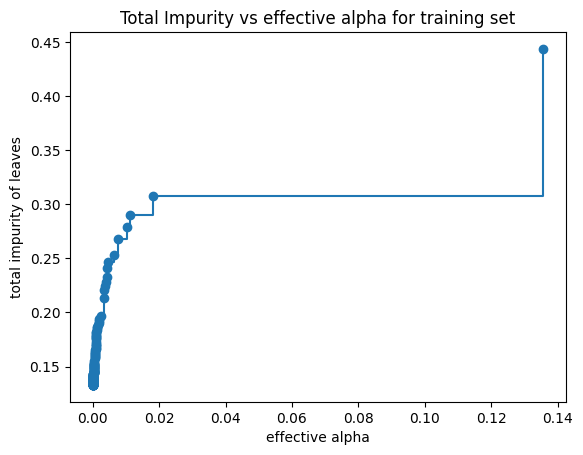

In [253]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [254]:
random_search.best_params_

{'min_samples_split': 10,
 'min_samples_leaf': 10,
 'max_depth': np.int64(10),
 'criterion': 'gini'}

In [255]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha, **random_search.best_params_)
    clf.fit(X_train, y_train)
    clfs.append(clf)
    
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.23996596550607874


In [256]:
import plotly.graph_objects as go
import plotly.subplots as sp
from plotly.subplots import make_subplots

In [257]:
# clfs = clfs[:-1]
# ccp_alphas = ccp_alphas[:-1]

# node_counts = [clf.tree_.node_count for clf in clfs]
# depth = [clf.tree_.max_depth for clf in clfs]

# fig, ax = plt.subplots(2, 1)
# ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
# ax[0].set_xlabel("alpha")
# ax[0].set_ylabel("number of nodes")
# ax[0].set_title("Number of nodes vs alpha")
# ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
# ax[1].set_xlabel("alpha")
# ax[1].set_ylabel("depth of tree")
# ax[1].set_title("Depth vs alpha")
# fig.tight_layout()

# Rimuovere l'ultimo elemento da clfs e ccp_alphas (se necessario)
clfs = clfs[:-1] 
ccp_alphas = ccp_alphas[:-1]

# Calcolare il numero di nodi e la profondità degli alberi
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

# Creare il primo grafico interattivo (Number of nodes vs alpha)
fig1 = go.Figure()
fig1.add_trace(go.Scatter(
    x=ccp_alphas,
    y=node_counts,
    mode='lines+markers',
    name="Number of nodes",
    hovertemplate='Alpha: %{x}<br>Number of nodes: %{y}<extra></extra>'
))
fig1.update_layout(
    title="Number of nodes vs alpha",
    xaxis_title="Alpha",
    yaxis_title="Number of nodes",
    template="plotly_white"
)

# Creare il secondo grafico interattivo (Depth vs alpha)
fig2 = go.Figure()
fig2.add_trace(go.Scatter(
    x=ccp_alphas,
    y=depth,
    mode='lines+markers',
    name="Depth of tree",
    hovertemplate='Alpha: %{x}<br>Depth: %{y}<extra></extra>'
))
fig2.update_layout(
    title="Depth vs alpha",
    xaxis_title="Alpha",
    yaxis_title="Depth of tree",
    template="plotly_white"
)

# Mostrare i grafici separatamente
fig1.show()
fig2.show()

In [258]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

# Creazione del grafico interattivo
fig = go.Figure()

# Curva di training
fig.add_trace(go.Scatter(
    x=ccp_alphas,
    y=train_scores,
    mode='lines+markers',
    name='Train Accuracy',
    hovertemplate='alpha: %{x}<br>accuracy: %{y:.2f}<extra></extra>'
))

# Curva di testing
fig.add_trace(go.Scatter(
    x=ccp_alphas,
    y=test_scores,
    mode='lines+markers',
    name='Test Accuracy',
    hovertemplate='alpha: %{x}<br>accuracy: %{y:.2f}<extra></extra>'
))

# Layout del grafico
fig.update_layout(
    title="Accuracy vs alpha for training and testing sets",
    xaxis_title="alpha",
    yaxis_title="accuracy",
    legend=dict(title="Dataset"),
    hovermode="x unified"
)

fig.show()

In [259]:
dtp = DecisionTreeClassifier(ccp_alpha=0.0024, **random_search.best_params_)
dtp.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0024, max_depth=np.int64(10),
                       min_samples_leaf=10, min_samples_split=10)

In [260]:
y_test_pred = dtp.predict(X_test)

In [261]:
print('Train Accuracy %s' % accuracy_score(y_train, y_train_pred))
print('Train F1-score %s' % f1_score(y_train, y_train_pred, average=None))
print()

print('Test Accuracy %s' % accuracy_score(y_test, y_test_pred))
print('Test F1-score %s' % f1_score(y_test, y_test_pred, average=None))

Train Accuracy 0.8805860805860806
Train F1-score [0.92064766 0.88932547 0.         0.79487179 0.89701181 0.58224543
 0.48829431]

Test Accuracy 0.8813186813186813
Test F1-score [0.92141028 0.87191651 0.         0.71604938 0.91022337 0.50094162
 0.62585034]


In [262]:
y_test_pred = dtp.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_test_pred))

Accuracy: 0.8813186813186813


In [263]:
print(classification_report(y_test, y_test_pred))

                  precision    recall  f1-score   support

           movie       0.89      0.95      0.92      2456
           short       0.82      0.93      0.87       988
         special       0.00      0.00      0.00        59
    tvMiniSeries       0.74      0.69      0.72        84
tvseries_related       0.93      0.89      0.91      2389
           video       0.59      0.43      0.50       306
       videoGame       0.78      0.52      0.63        88

        accuracy                           0.88      6370
       macro avg       0.68      0.63      0.65      6370
    weighted avg       0.87      0.88      0.87      6370



c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



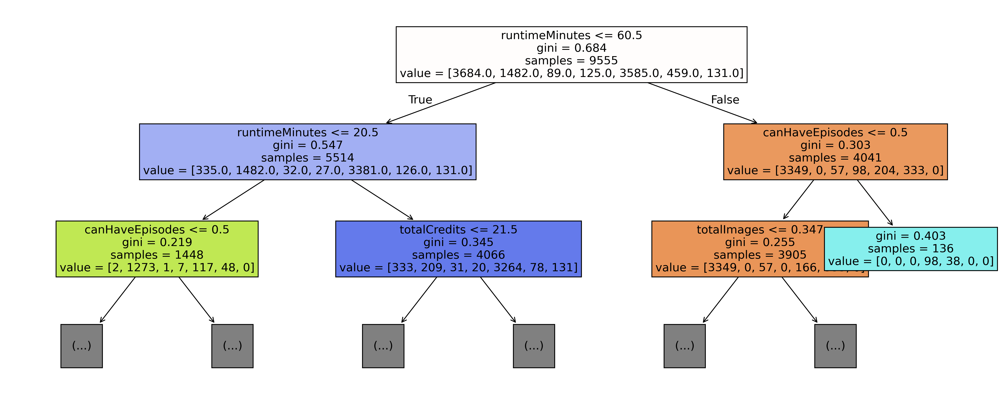

In [264]:
plt.figure(figsize=(20, 8), dpi=300)
plot_tree(dtp, feature_names=attributes, filled=True, max_depth=2, fontsize=13)
plt.show()

### ROC CURVES

In [265]:
# Return probability estimates for the test data X.
y_test_pred_proba = dtp.predict_proba(X_test)
y_test_pred_proba[0:10]

array([[9.67769296e-01, 0.00000000e+00, 2.54452926e-03, 0.00000000e+00,
        9.32994063e-03, 2.03562341e-02, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.60427807e-02,
        9.83957219e-01, 0.00000000e+00, 0.00000000e+00],
       [1.45560408e-03, 9.14119360e-01, 7.27802038e-04, 0.00000000e+00,
        4.94905386e-02, 3.42066958e-02, 0.00000000e+00],
       [2.78611230e-02, 1.75739391e-02, 4.71495928e-03, 1.71453065e-03,
        9.29275611e-01, 7.71538791e-03, 1.11444492e-02],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.80898876e-02,
        9.71910112e-01, 0.00000000e+00, 0.00000000e+00],
       [2.78611230e-02, 1.75739391e-02, 4.71495928e-03, 1.71453065e-03,
        9.29275611e-01, 7.71538791e-03, 1.11444492e-02],
       [2.78611230e-02, 1.75739391e-02, 4.71495928e-03, 1.71453065e-03,
        9.29275611e-01, 7.71538791e-03, 1.11444492e-02],
       [2.78611230e-02, 1.75739391e-02, 4.71495928e-03, 1.71453065e-03,
        9.29275611e-01, 7

In [266]:
# Ora, visto che le label sono più di 2, possiamo solo fare una ROC curve per ogni label vs the rest, con il metodo one-vs-the rest

from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize


In [267]:
# Classi uniche nel dataset
classes = np.unique(y_test)

# Binarizza y_val
y_test_binarized = label_binarize(y_test, classes=classes)

y_test_binarized


array([[1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0]])

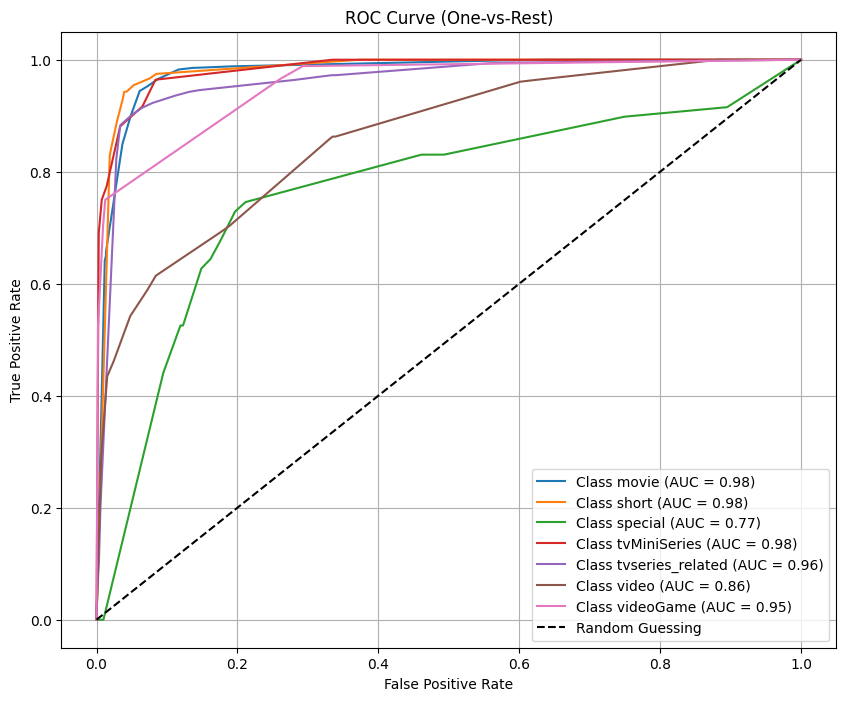

In [268]:
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(classes):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    auc = roc_auc_score(y_test_binarized[:, i], y_test_pred_proba[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()


In [269]:
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_test_binarized, y_test_pred_proba, multi_class="ovr", average="macro")

np.float64(0.9265998878279458)

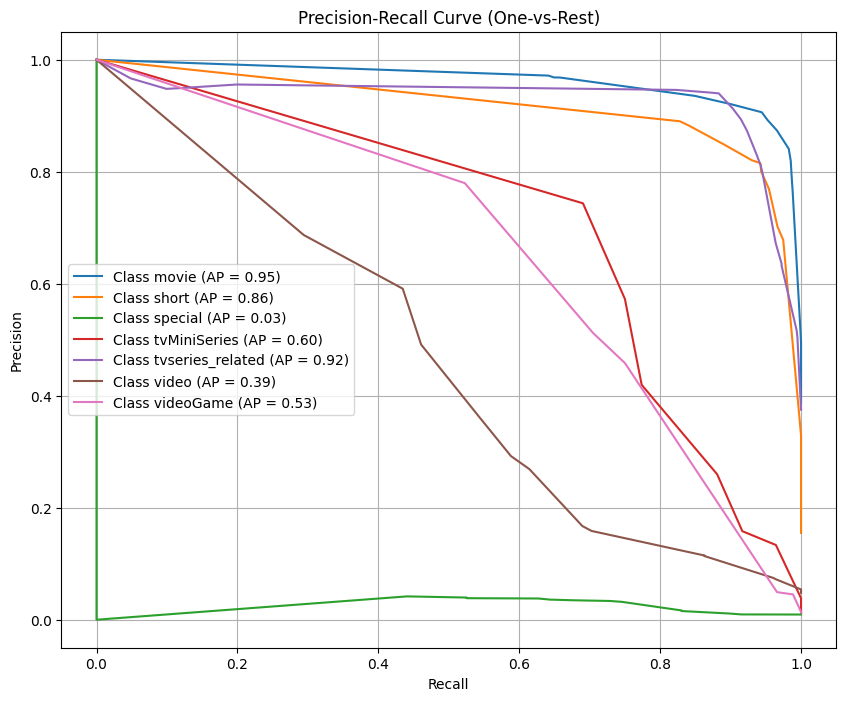

In [270]:
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(10, 8))

for i, class_label in enumerate(classes):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_test_pred_proba[:, i])
    ap = average_precision_score(y_test_binarized[:, i], y_test_pred_proba[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()

### PRUNING
In scikit-learn's decision trees, it can sometimes occur that a node split creates branches where all subsequent splits lead to the same predicted label as the node itself. In such cases, these branches do not contribute additional information to the predictions. Tree pruning functions are designed to simplify the tree by removing such redundant branches, keeping only the root node of the branch. This process reduces the complexity of the tree and is particularly useful for improving interpretability and visualization.

In [271]:
from sklearn.tree._tree import TREE_LEAF

In [272]:
def is_leaf(inner_tree, index):
    # Check whether node is leaf node
    return (inner_tree.children_left[index] == TREE_LEAF and
            inner_tree.children_right[index] == TREE_LEAF)


def prune_index(inner_tree, decisions, index=0):
    # Start pruning from the bottom - if we start from the top, we might miss
    # nodes that become leaves during pruning.
    # Do not use this directly - use prune_duplicate_leaves instead.
    if not is_leaf(inner_tree, inner_tree.children_left[index]):
        prune_index(inner_tree, decisions, inner_tree.children_left[index])
    if not is_leaf(inner_tree, inner_tree.children_right[index]):
        prune_index(inner_tree, decisions, inner_tree.children_right[index])

    # Prune children if both children are leaves now and make the same decision:
    if (is_leaf(inner_tree, inner_tree.children_left[index]) and
        is_leaf(inner_tree, inner_tree.children_right[index]) and
        (decisions[index] == decisions[inner_tree.children_left[index]]) and
        (decisions[index] == decisions[inner_tree.children_right[index]])):
        # turn node into a leaf by "unlinking" its children
        inner_tree.children_left[index] = TREE_LEAF
        inner_tree.children_right[index] = TREE_LEAF
        # print("Pruned {}".format(index))


def prune_duplicate_leaves(dt):
    # Remove leaves if both
    decisions = dt.tree_.value.argmax(axis=2).flatten().tolist()  # Decision for each node
    prune_index(dt.tree_, decisions)

In [273]:
dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=20, min_samples_leaf=10, random_state=94)

In [274]:
dt.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_leaf=10, min_samples_split=20,
                       random_state=94)

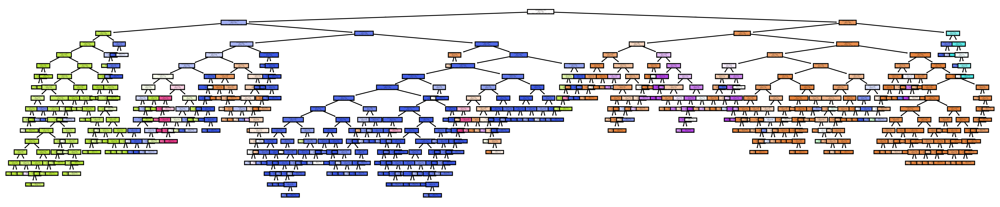

In [275]:
plt.figure(figsize=(20, 4), dpi=300)
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [276]:
prune_duplicate_leaves(dt)

In [277]:
# let us visualise it again after pruning

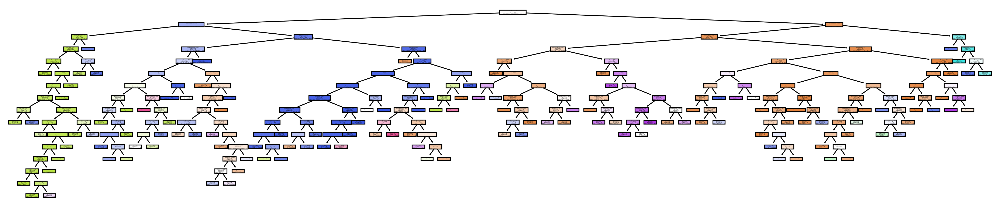

In [278]:
plt.figure(figsize=(20, 4), dpi=300)    
plot_tree(dt, feature_names=attributes, filled=True)
plt.show()

In [291]:
print(X.shape)
print(y.shape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(15925, 13)
(15925,)
(9555, 13)
(9555,)
(6370, 13)
(6370,)


In [357]:
final_clf = DecisionTreeClassifier(ccp_alpha=0.0024,
    **random_search.best_params_,  # o grid_search.best_params_
    random_state=42
)
final_clf.fit(X, y)  # Usa tutto il set di training (train + validation)
prune_duplicate_leaves(final_clf)

### APPLICAZIONE AL TEST SET

In [358]:
df_test = pd.read_csv('test_log.csv')

In [359]:
df_test.dtypes

originalTitle       object
rating              object
startYear            int64
runtimeMinutes       int64
awardWins          float64
numVotes           float64
totalImages        float64
totalVideos        float64
totalCredits         int64
titleType           object
AwNmExWins         float64
canHaveEpisodes       bool
isAdult               bool
numRegions           int64
countryOfOrigin     object
genres              object
ratingMean         float64
ReviewsTotal       float64
dtype: object

In [360]:
# Calcolo del numero di virgole per ogni riga nella colonna 'countryOfOrigin'
df_test['number_of_countries'] = df_test['countryOfOrigin'].apply(lambda x: x.count(',')+1)
df_test['number_of_us'] = df_test['countryOfOrigin'].apply(lambda x: x.count('US'))

# Visualizza il risultato
#print(df_test[['countryOfOrigin', 'number_of_countries']])

count = df_test['number_of_countries'].value_counts()
pd.set_option('display.max_rows', None)  # None per mostrare tutte le righe
print(count)

number_of_countries
1     4953
2      295
3       56
4       12
5        6
6        4
10       1
7        1
13       1
Name: count, dtype: int64


In [361]:
df_test['number_of_us'] = df_test['countryOfOrigin'].apply(lambda x: x.count('US'))
count = df_test['number_of_us'].value_counts()
print(count)

number_of_us
0    3001
1    2328
Name: count, dtype: int64


In [362]:
df_test['produced_in_USA'] = df_test['number_of_us'].apply(lambda x: 1 if x > 0 else 0)

In [363]:
df_test.head()

,originalTitle,rating,startYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,titleType,...,canHaveEpisodes,isAdult,numRegions,countryOfOrigin,genres,ratingMean,ReviewsTotal,number_of_countries,number_of_us,produced_in_USA
0,Geologist of Animal Collective Performs Live a...,"(9, 10]",2015,21,0.0,2.772589,2.079442,1.098612,11,video,...,False,False,1,['US'],"Music,Short",9.5,0.000000,1,1,1
1,Shan gou 1999,"(4, 5]",1999,93,0.0,5.720312,2.397895,0.000000,40,movie,...,False,False,4,['HK'],Horror,4.5,2.890372,1,0,0
2,The Craftsman: Preserving the Last Higgins Boat,"(8, 9]",2023,113,0.0,2.397895,1.098612,0.000000,6,tvSpecial,...,False,False,1,['US'],Reality-TV,8.5,0.000000,1,1,1
3,Week 3: Tuesday,"(6, 7]",2020,40,0.0,2.484907,0.000000,0.000000,52,tvEpisode,...,False,False,1,['GB'],Game-Show,6.5,0.000000,1,0,0
4,Traumhaus,"(5, 6]",1999,90,0.0,4.983607,1.098612,0.000000,44,tvEpisode,...,False,False,1,['DE'],"Crime,Drama,Mystery",5.5,0.693147,1,0,0


In [364]:
mapping = {
    'short': 'short',
    'tvShort': 'short',
    'movie': 'movie',
    'tvMovie': 'movie',
    'tvSpecial': 'special',
    'videogame': 'videogame',
    'video': 'video',
    'tvMiniseries': 'tvseries_related',
    'tvSeries': 'tvseries_related',
    'tvEpisode': 'tvseries_related'
}

df_test['grouped_titleType'] = df_test['titleType'].replace(mapping)

In [365]:
del df_test['originalTitle']
del df_test['titleType'] 
del df_test['rating']
del df_test['genres']
del df_test['countryOfOrigin']
del df_test['isAdult']
#del df_test['startYear']
del df_test['number_of_countries']
del df_test['number_of_us']
# del df_test['canHaveEpisodes']

In [366]:
# Trasformare la colonna booleana 'canHaveEpisodes' in 1/0
df_test['canHaveEpisodes'] = df_test['canHaveEpisodes'].astype(int)

# Visualizzare i risultati
print(df_test[['canHaveEpisodes']].head())


   canHaveEpisodes
0                0
1                0
2                0
3                0
4                0


In [367]:
df_test.head()

,startYear,runtimeMinutes,awardWins,numVotes,totalImages,totalVideos,totalCredits,AwNmExWins,canHaveEpisodes,numRegions,ratingMean,ReviewsTotal,produced_in_USA,grouped_titleType
0,2015,21,0.0,2.772589,2.079442,1.098612,11,0.0,0,1,9.5,0.000000,1,video
1,1999,93,0.0,5.720312,2.397895,0.000000,40,0.0,0,4,4.5,2.890372,0,movie
2,2023,113,0.0,2.397895,1.098612,0.000000,6,0.0,0,1,8.5,0.000000,1,special
3,2020,40,0.0,2.484907,0.000000,0.000000,52,0.0,0,1,6.5,0.000000,0,tvseries_related
4,1999,90,0.0,4.983607,1.098612,0.000000,44,0.0,0,1,5.5,0.693147,0,tvseries_related


In [368]:
attributes = [col for col in df_test.columns if col != 'grouped_titleType']
X_testset = df_test[attributes].values
y_testset = df_test['grouped_titleType']

In [369]:
y_testset_pred = final_clf.predict(X_testset)
y_testset_pred

array(['short', 'movie', 'movie', ..., 'movie', 'tvseries_related',
       'tvseries_related'], dtype=object)

In [370]:
test_accuracy = accuracy_score(y_testset, y_testset_pred)
print(f"Test Accuracy: {test_accuracy:f}")

Test Accuracy: 0.864327


In [371]:
from sklearn.metrics import classification_report
print(classification_report(y_testset, y_testset_pred))

                  precision    recall  f1-score   support

           movie       0.84      0.96      0.90      2094
           short       0.82      0.94      0.87       770
         special       0.00      0.00      0.00        46
    tvMiniSeries       0.75      0.71      0.73        78
tvseries_related       0.95      0.87      0.90      2016
           video       0.57      0.29      0.38       242
       videoGame       0.00      0.00      0.00        83

        accuracy                           0.86      5329
       macro avg       0.56      0.54      0.54      5329
    weighted avg       0.84      0.86      0.85      5329



c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\tomma\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



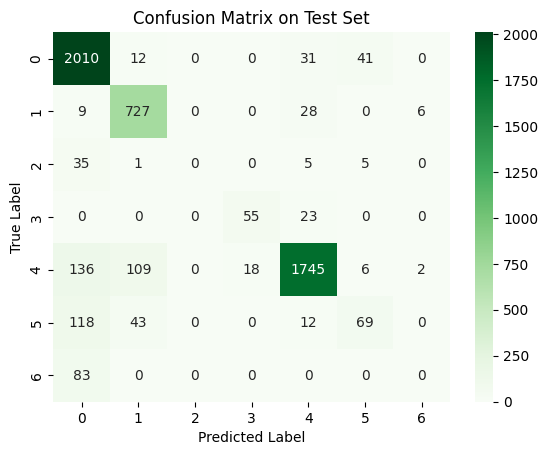

In [372]:
cm = confusion_matrix(y_testset, y_testset_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix on Test Set")
plt.show()

In [373]:
# Return probability estimates for the test data X.
y_testset_pred_proba = final_clf.predict_proba(X_testset)
y_testset_pred_proba[0:10]

array([[0.02991453, 0.5042735 , 0.00854701, 0.        , 0.41880342,
        0.03846154, 0.        ],
       [0.96934673, 0.        , 0.00251256, 0.        , 0.00854271,
        0.01959799, 0.        ],
       [0.82220708, 0.        , 0.04359673, 0.        , 0.08991826,
        0.04427793, 0.        ],
       [0.02350537, 0.01686254, 0.00408789, 0.00178845, 0.93484926,
        0.0074093 , 0.01149719],
       [0.82220708, 0.        , 0.04359673, 0.        , 0.08991826,
        0.04427793, 0.        ],
       [0.96934673, 0.        , 0.00251256, 0.        , 0.00854271,
        0.01959799, 0.        ],
       [0.01171875, 0.00195312, 0.00195312, 0.015625  , 0.9609375 ,
        0.00195312, 0.00585938],
       [0.96934673, 0.        , 0.00251256, 0.        , 0.00854271,
        0.01959799, 0.        ],
       [0.96934673, 0.        , 0.00251256, 0.        , 0.00854271,
        0.01959799, 0.        ],
       [0.96934673, 0.        , 0.00251256, 0.        , 0.00854271,
        0.01959799, 0. 

In [374]:
# Classi uniche nel dataset
classes = np.unique(y_testset)

# Binarizza y_val
y_testset_binarized = label_binarize(y_testset, classes=classes)

y_testset_binarized


array([[0, 0, 0, ..., 0, 1, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

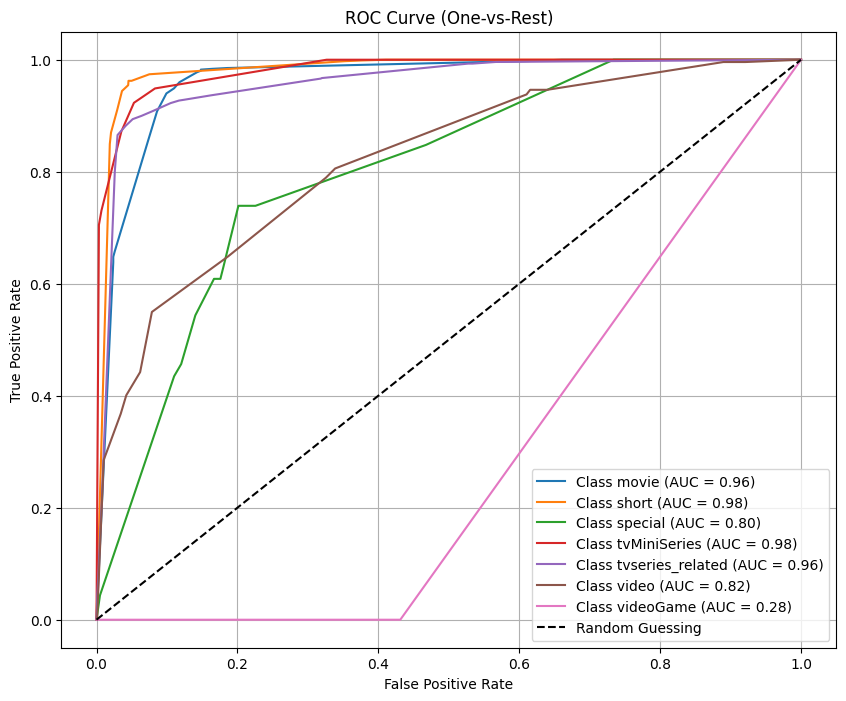

In [375]:
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(classes):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_testset_binarized[:, i], y_testset_pred_proba[:, i])
    auc = roc_auc_score(y_testset_binarized[:, i], y_testset_pred_proba[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()


In [376]:
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_testset_binarized, y_testset_pred_proba, multi_class="ovr", average="macro")

np.float64(0.8272489623025161)

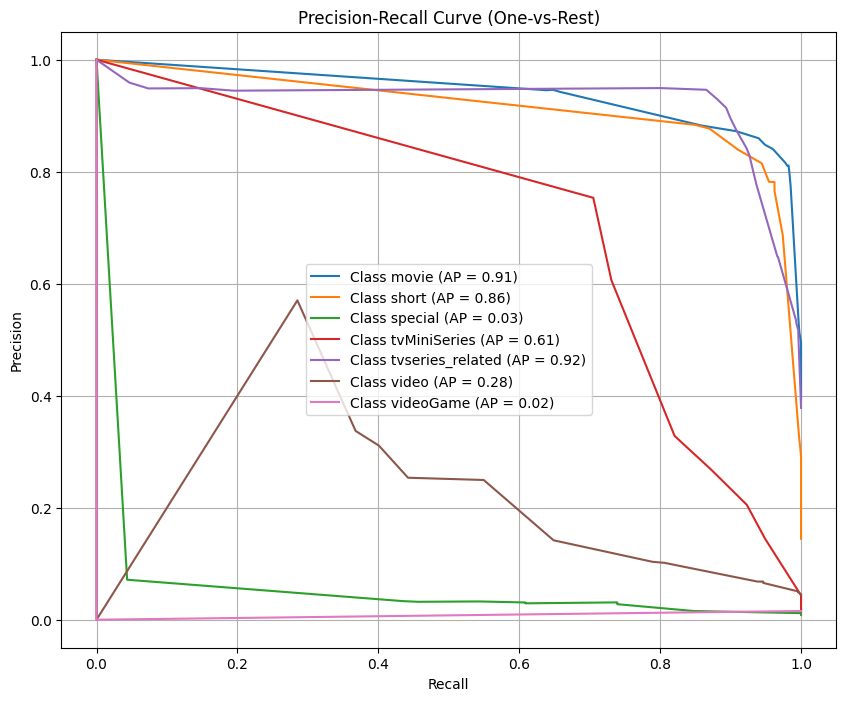

In [377]:
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(classes):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_testset_binarized[:, i], y_testset_pred_proba[:, i])
    ap = average_precision_score(y_testset_binarized[:, i], y_testset_pred_proba[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()

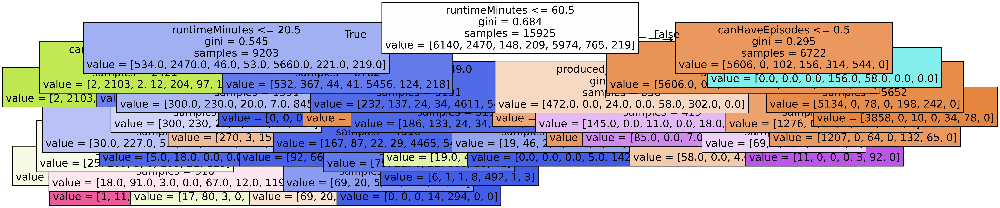

In [378]:
plt.figure(figsize=(20, 4), dpi=700)
plot_tree(final_clf, feature_names=attributes, filled=True, max_depth=None, fontsize=13)
plt.title("Decision Tree - Final Model")
plt.show()

In [379]:
prune_duplicate_leaves(final_clf)

In [386]:
plt.figure(figsize=(40, 15), dpi=700)
plot_tree(final_clf, feature_names=attributes, filled=True, max_depth=2, fontsize=13)
plt.title("Decision Tree - Final Model", fontsize=20)
plt.show()

In [387]:
zipped = zip(attributes, final_clf.feature_importances_)
zipped = sorted(zipped, key=lambda x: x[1], reverse=True)
for col, imp in zipped:
    print(col, imp)

runtimeMinutes 0.8289603665084636
canHaveEpisodes 0.08089275861001693
totalCredits 0.025841212306663402
totalImages 0.021293883313671914
startYear 0.015746817068700354
numRegions 0.014685455851507153
produced_in_USA 0.009329042331572826
awardWins 0.0032504640094038425
numVotes 0.0
totalVideos 0.0
AwNmExWins 0.0
ratingMean 0.0
ReviewsTotal 0.0
